#**Introduction To Computer Vision**

Computer vision is the field of having a computer understand and label what is present in an image.

Given a two-dimensional image, a computer vision system must recognize the present objects and their characteristics such as shapes, textures, colors, sizes, spatial arrangement, among other things, to provide a description as complete as possible of the image.

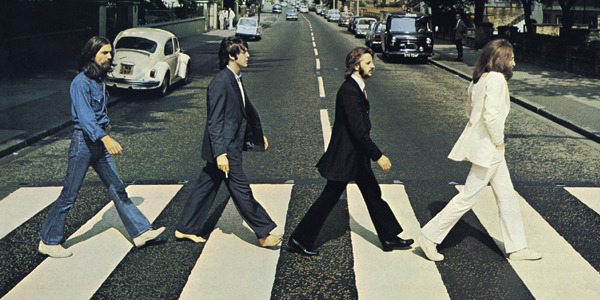


##**Image Processing**
Image processing is focused on processing raw images to apply some kind of transformation. Usually, the goal is to improve images or prepare them as an input for a specific task. For Example changing colour,texture, noise level of image etc.

##**Computer Vision**
Computer vision can solve more complex problems such as facial recognition

#**Basics of Image**



*  A two dimensional image is read as a 2D or 3D matrix whose each element store a value and is known as pixel.
*   The range of these values is from 0-255.

##**Color Reperesentation**


###**BGR**

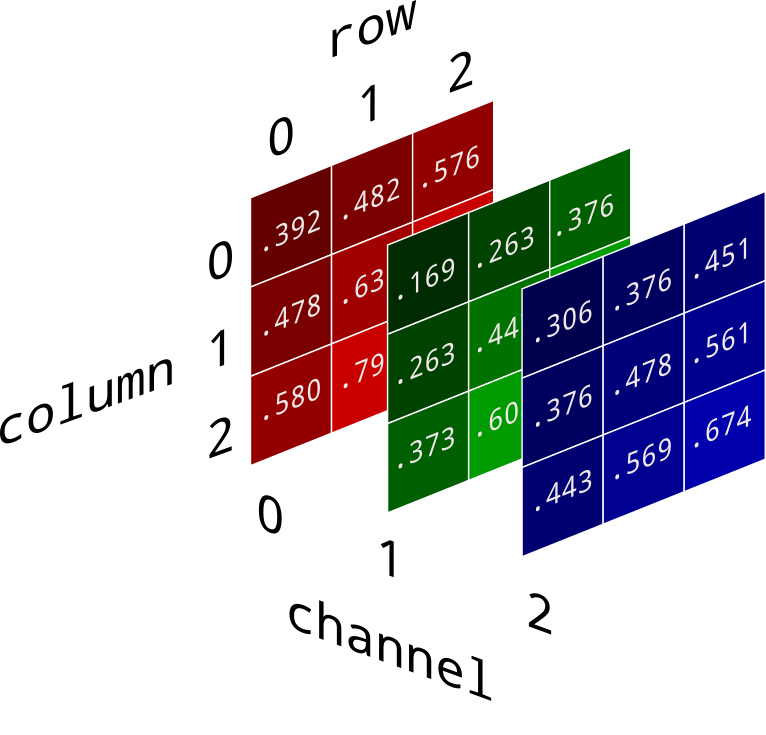


###**Grayscale**

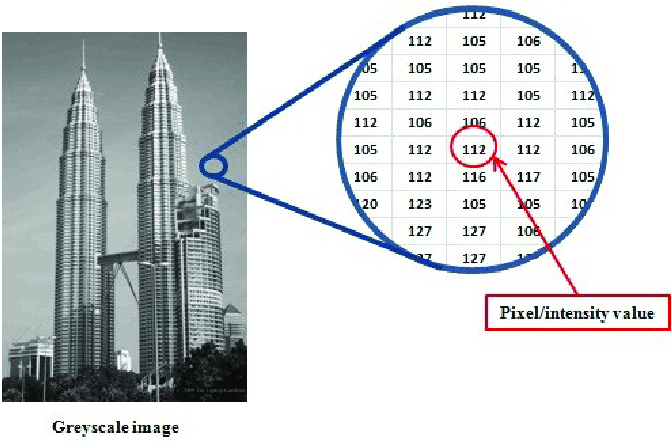


##Step1: Load the Dependencies

> This section loads some required libraries used in this notebook: **numpy**, **pandas**, **cv2**, **skimage**, **PIL**, **matplotlib**

*   [Numpy](https://www.numpy.org/) is an array manipulation library, used for linear algebra, Fourier transform, and random number capabilities.
*   [Pandas](https://pandas.pydata.org/) is a library for data manipulation and data analysis.
*   [CV2](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_gui/py_image_display/py_image_display.html) is a library for computer vision tasks.
*   [Skimage](https://scikit-image.org/) is a library which supports image processing applications on python.
*   [Matplotlib](https://matplotlib.org/) is a library which generates figures and provides graphical user interface toolkit.









In [ ]:
import numpy as np
import math
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from skimage.exposure import rescale_intensity
from PIL import Image 
import matplotlib.pylab as plt

##Step2: Read Image from Urls

> In this step we will read images from urls, and display them using openCV, please note the difference when reading image in RGB and BGR format. The default input color channels are in BGR format for openCV.



Read an image from a URL and display it






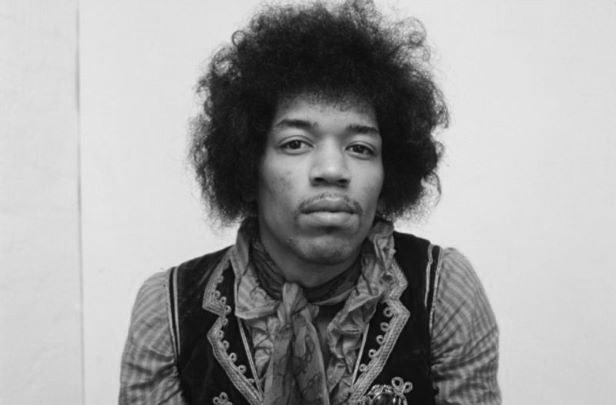

(405, 616)




In [ ]:
#url = "https://iiif.lib.ncsu.edu/iiif/0052574/full/800,/0/default.jpg"
url = "https://i.ibb.co/2c2pw6B/Jimi-Hendrix-Copenhagen-May-1967-portrait-small.jpg"
      
# Read and display the image

image = io.imread(url) 
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB) # tch!tch! OpenCV 
image_3 = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
#gray = (image_2[0]/3 + image_2[1]/3 + image_2[2]/3)
#final_frame = cv.hconcat((image, image_3))
cv2_imshow(image_3)
print(image_3.shape)
print('\n')

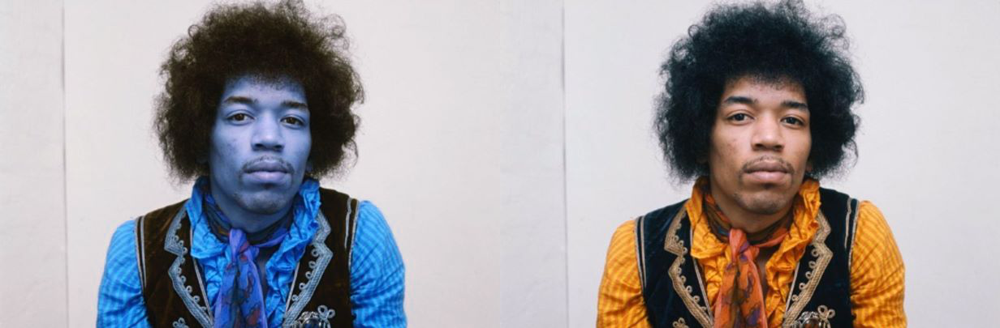

In [ ]:
res = np.hstack((image,image_2)) #stacking images side-by-side
cv2_imshow(res)

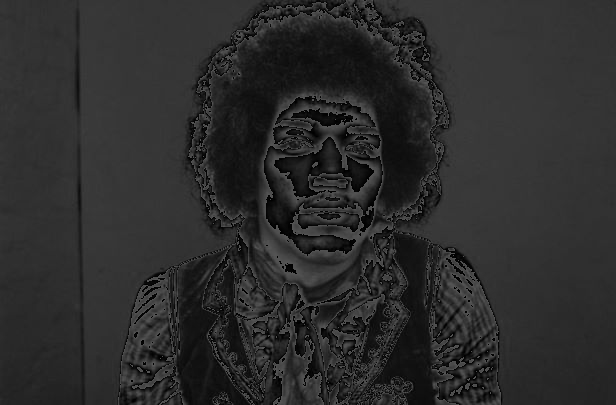

In [ ]:
#Colour Channels
R, G, B = cv.split(image_2) 
gray = (R+G+B)/3
cv2_imshow(gray)

#Gaussian Noise

Now, we'll take a look at noise, particularly gaussian noise. Noise is always there and one part of image processing is performing noise reduction operations. There are various models of noise - Gaussian Noise, Salt and Pepper noise, Poisson Noise etc. One thing we assume is noise should have zero mean. We assume that become its random and therefore there should be as many negatives as positive noise. The distribution of gaussian noise follows a curve some of you might be very familiar with. (That's a bell curve or normal distribution)

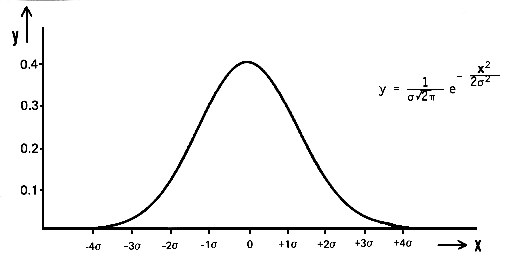

Gaussian distribution is something we see very often in nature. Exam scores often follow that (only for offline semester, of course) and profs assign grades according to that. We use the same model to approximate noise. 



Next we'll take a look at a code that adds gaussian noise to an image



[[207 205 234 ... 207 200 226]
 [221 214 211 ... 214 202 207]
 [206 235 224 ... 210 200 207]
 ...
 [204 220 183 ... 191 214 204]
 [200 211 215 ... 190 198 204]
 [207 212 182 ... 213 214 189]]


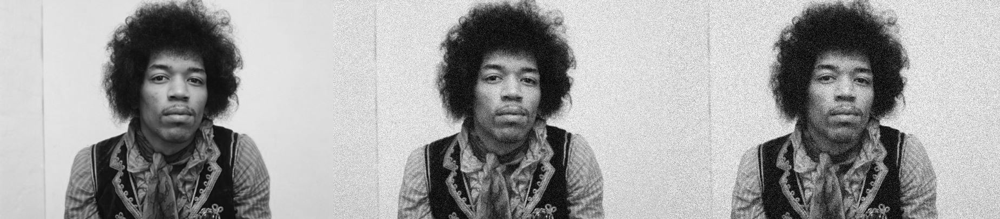

In [ ]:
def noisy(noise_typ,image,var):
   if noise_typ == "gauss":
      row,col,ch= image.shape
      mean = 0
      sigma = var**0.5
      gauss = np.random.normal(mean,sigma,(row,col,ch))
      gauss = gauss.reshape(row,col,ch)
      noisy = image + gauss
      noisy = rescale_intensity(noisy, in_range=(0, 255))
      noisy = (noisy*255).astype("uint8")
      return noisy


image_noise = noisy("gauss", image_2, 500)
image_noise_2 = noisy("gauss", image_2, 1000)
image_noise_2 = cv.cvtColor(src=image_noise_2, code=cv.COLOR_BGR2GRAY)
image_noise = cv.cvtColor(src=image_noise, code=cv.COLOR_BGR2GRAY) 

print(image_noise)
res = np.hstack((image_3,image_noise,image_noise_2)) #stacking images side-by-side
cv2_imshow(res)

In [ ]:
def normalize(image):
  image = np.where(image<0, 0, image) 
  cv.normalize(image, image, 0, 255, cv.NORM_MINMAX)
  return image

So we want to remove noise, right? Before that we'll take a look at the basics for any image enhancement process. At the end we'll be able to remove noise and we'll take a look at edge detection and a few other interesting operations  

# Convolution and Filter

Convolution is an operation on a matrix. 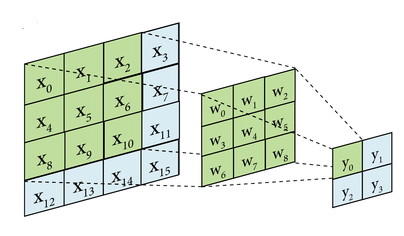

The gif provides a visualization of the concept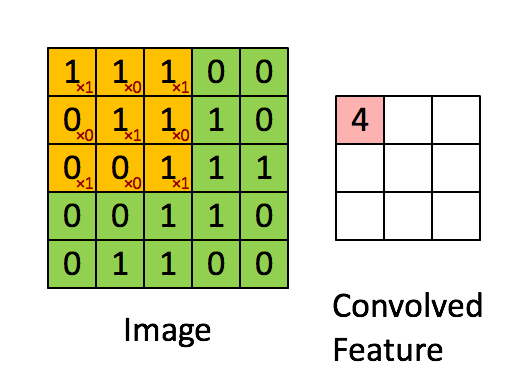

In [ ]:
def convolve2D(image, kernel, padding=0, strides=1, correlation=0, normalize = 0):
    #Correlation
    if correlation == 0:
      kernel = np.flipud(np.fliplr(kernel))
    
    image = np.array(image)

    # Gather Shapes of Kernel + Image + Padding
    xKernShape = kernel.shape[0]
    yKernShape = kernel.shape[1]
    xImgShape = image.shape[0]
    yImgShape = image.shape[1]

    # Shape of Output Convolution
    xOutput = int(((xImgShape - xKernShape + 2 * padding) / strides) + 1)
    yOutput = int(((yImgShape - yKernShape + 2 * padding) / strides) + 1)
    output = np.zeros((xOutput, yOutput))

    # Apply Equal Padding to All Sides
    if padding != 0:
        imagePadded = np.zeros((image.shape[0] + padding*2, image.shape[1] + padding*2))
        imagePadded[int(padding):int(-1 * padding), int(padding):int(-1 * padding)] = image
        print(imagePadded)
    else:
        imagePadded = image

    # Iterate through image
    for y in range(image.shape[1]):
        # Exit Convolution
        if y > image.shape[1] - yKernShape:
            break
        # Only Convolve if y has gone down by the specified Strides
        if y % strides == 0:
            for x in range(image.shape[0]):
                # Go to next row once kernel is out of bounds
                if x > image.shape[0] - xKernShape:
                    break
                try:
                    # Only Convolve if x has moved by the specified Strides
                    if x % strides == 0:
                        
                        output[x, y] = (kernel * imagePadded[x: x + xKernShape, y: y + yKernShape]).sum()
                        
                except:
                    break
    if normalize:
      cv.normalize(output, output, 0, 255, cv.NORM_MINMAX)
    return output

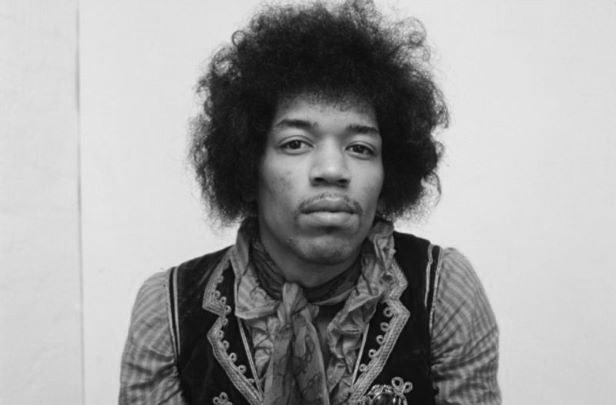

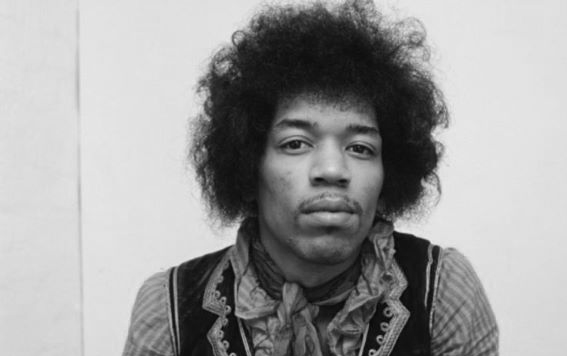

In [ ]:
#kernel = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])
#r_shift = np.array([[0,0,0],
 #                   [0,0,1],
  #                  [0,0,0]])
l_shift = np.zeros([50,50])
l_shift[0][0]=1;
l_shift = np.array(l_shift)


image_3_x = convolve2D(image_3, l_shift, correlation = 1)
#res = np.hstack((image_3_x,image_3)) #stacking images side-by-side
cv2_imshow(image_3)
cv2_imshow(image_3_x)

## Averaging
Let's see what averaging does to an image.

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]
[[  0.   0.   0. ...   0.   0.   0.]
 [  0.   0.   0. ...   0.   0.   0.]
 [  0.   0. 207. ... 226.   0.   0.]
 ...
 [  0.   0. 207. ... 189.   0.   0.]
 [  0.   0.   0. ...   0.   0.   0.]
 [  0.   0.   0. ...   0.   0.   0.]]


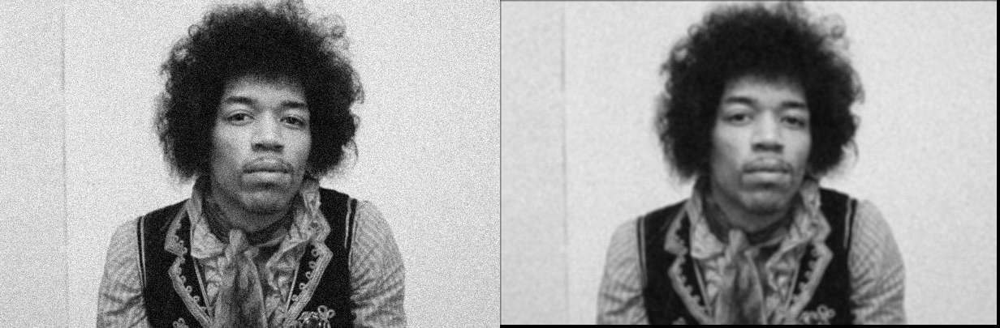

In [ ]:
avg = np.ones([5,5])/25
print(avg)
#print(image_noise)
image_avg = convolve2D(image_noise,avg,padding=2)

res = np.hstack((image_noise,image_avg)) #stacking images side-by-side
cv2_imshow(res)


As you can see, it smoothes the noise a little bit. But it also reduces clarity, which is bad. So we'll see other ways to smooth noise. A better way to approach this is through something called gaussian smoothing

## Gaussian Smoothing

**Gaussian smoothing** uses a mask whose values follow gaussian distribution so the pixel at the centre of the mask holds greatest weightage while the values at the edges hold less weightage, which makes intuitive sense. And following is the formula we'll use to get the kernel.

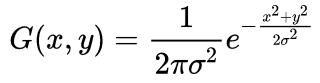

What a gaussian kernel looks like:

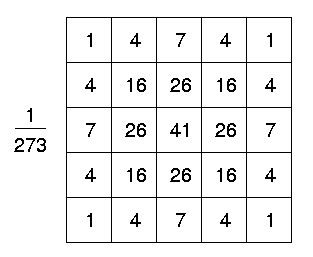

In [ ]:
def gaussian_filter(shape, sigma):
  gaussian = np.zeros(shape)
  for i in range(shape[0]):
    for j in range(shape[1]):
      gaussian[i][j] = (math.exp((-((shape[0]-i)**2)+((shape[0]-j)**2))/(2*(sigma**2))))/((2*(sigma**2)*np.pi))
  return gaussian

gaussian = gaussian_filter([7,7], 2.6) 
print(gaussian) 

[[2.35436306e-02 9.00083059e-03 3.98966550e-03 2.05038365e-03
  1.22173923e-03 8.44047046e-04 6.76082252e-04]
 [6.15834881e-02 2.35436306e-02 1.04358381e-02 5.36322451e-03
  3.19572475e-03 2.20778868e-03 1.76844022e-03]
 [1.38934591e-01 5.31152877e-02 2.35436306e-02 1.20996297e-02
  7.20967137e-03 4.98085162e-03 3.98966550e-03]
 [2.70340892e-01 1.03352478e-01 4.58115295e-02 2.35436306e-02
  1.40286805e-02 9.69181154e-03 7.76314757e-03]
 [4.53699554e-01 1.73451278e-01 7.68831914e-02 3.95120940e-02
  2.35436306e-02 1.62652810e-02 1.30285011e-02]
 [6.56719961e-01 2.51066847e-01 1.11286701e-01 5.71928727e-02
  3.40788790e-02 2.35436306e-02 1.88584640e-02]
 [8.19874419e-01 3.13441493e-01 1.38934591e-01 7.14017785e-02
  4.25453812e-02 2.93927726e-02 2.35436306e-02]]


Now we have a gaussian kernel and we'll try smoothing with that, and hopefully we'll have better results

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[180.29913917 179.98069566 186.57108807 ...   0.           0.
    0.        ]
 [345.11699129 345.89683659 357.64871419 ...   0.           0.
    0.        ]
 [583.58585993 587.07370694 606.11855841 ...   0.           0.
    0.        ]
 ...
 [  0.           0.           0.         ...   0.           0.
    0.        ]
 [  0.           0.           0.         ...   0.           0.
    0.        ]
 [  0.           0.           0.         ...   0.           0.
    0.        ]]


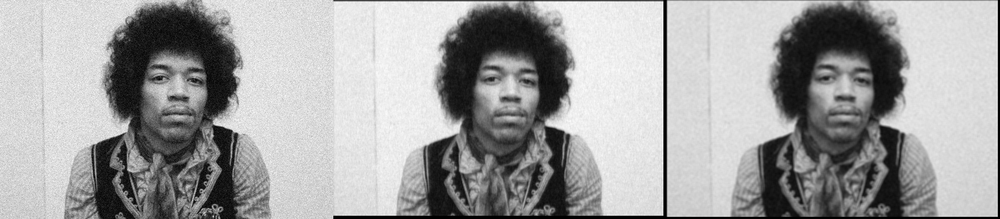

In [ ]:

#print(image_noise)
image_gaussian = convolve2D(image_noise,gaussian,padding = 3)
image_gaussian_normalized = np.zeros(image_gaussian.shape)
cv.normalize(image_gaussian, image_gaussian_normalized, 0, 255, cv.NORM_MINMAX)
print(image_gaussian)
res = np.hstack((image_noise,image_gaussian_normalized,image_avg)) #stacking images side-by-side
cv2_imshow(res)


So you see Gaussian smoothing does a better job at removing noise. Interesting thing is our eyes also perform noise reduction and not just any noise reduction, they perform gaussian smoothening.

## Sharpening
Now that we have smoothened the noise out, we want to get some of that sharp features back. For that we'll do some algebra (Woah!)

The basic idea is:

1.   Coarse = Input * Blurring
2.   Fine = Input - Course
3.   Sharp = Input + Fine * 0.5

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


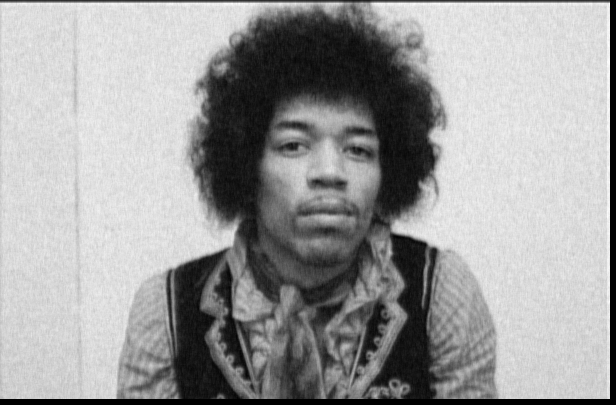

In [ ]:
coarse = convolve2D(image_gaussian, gaussian_filter([7,7],0.2), padding = 3)
coarse = normalize(coarse)
fine = image_gaussian - coarse
sharp = image_gaussian + 0.5*fine
sharp = normalize(sharp)
cv2_imshow(sharp)

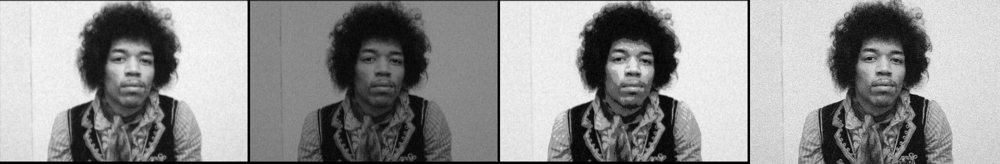

In [ ]:
#coarse = convolve2D(image_gaussian, gaussian, padding = 3)
coarse_median = cv.medianBlur(np.float32(image_gaussian),5)
fine_median = image_gaussian - coarse_median
sharp_median = image_gaussian + 1*fine_median

coarse_nlm = cv.fastNlMeansDenoising(np.uint8(image_gaussian), 7, 21)
fine_nlm = image_gaussian - coarse_nlm
sharp_nlm = image_gaussian + fine_nlm

image_gaussian = normalize(image_gaussian)

sharp_median = normalize(sharp_median)

sharp_nlm = normalize(sharp_nlm)

res = np.hstack((image_gaussian,sharp_median,sharp_nlm,image_noise)) #stacking images side-by-side
cv2_imshow(res)


# Edge Detector

## Gradient

Images can be differentiated and the operation is quite useful. You guys now the standard definition of differential of a function: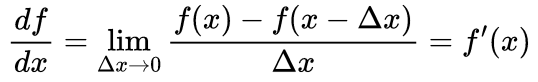

For images however, we have what are called discrete derivatives. And to differentiate a pixel, we use the pixel which is at a distance of one  unit since that's the shortest interval we have. Behold! Discrete derivatives!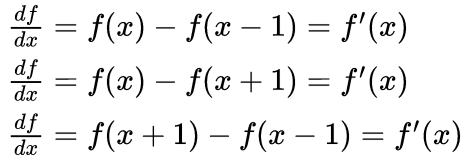

As you can see, these are of three types. Each has its uses. I'll differentiate using the first one - Backward derivative. The other two are called - Forward Derivative and Central Derivative

You guys will then differentiate using the other two. Match your answers to ones I have provided!

In [ ]:
arr = np.array([[2.2,6,3],
        [2,6,3],
        [5,6,3]])
# How do i differentiate this?
print(arr)
mask_x_p = np.array([[-1,0,1],  #Prewitt Edge Detector
                   [-1,0,1],
                   [-1,0,1]]);
mask_x1 = np.array([[-1,0,1]]);
mask_x = np.array([-1,1])    #Backward
#Forward Diffy = [[0.2, 0, 0],[-3, 0, 1]]
#Forward Diffx = [[-3.8, 3], [-4, 3], [-1, 4]]


[[2.2 6.  3. ]
 [2.  6.  3. ]
 [5.  6.  3. ]]


[[ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.         25.12205849 25.03011933 ...  0.          0.
   0.        ]
 [ 0.         49.82008289 49.93265895 ...  0.          0.
   0.        ]
 ...
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]]


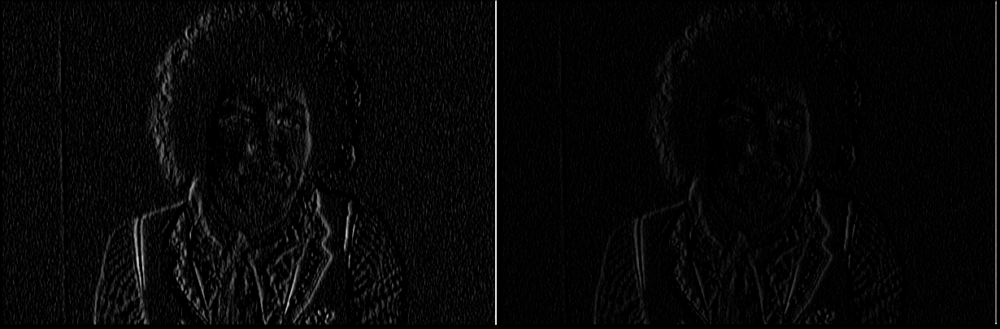

In [ ]:
prewitt_x = convolve2D(sharp_median, mask_x_p, 1)
res = np.hstack((prewitt_x,convolve2D(sharp_median, mask_x1))) #stacking images side-by-side
cv2_imshow(res)

## Sobel Edge Detector

Like prewitt detector, but emphasis on pixels closer to central pixel and another new thing - Thresholding!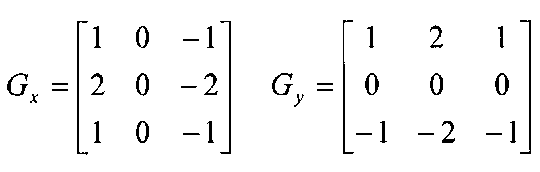

[[ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.         25.12205849 25.03011933 ...  0.          0.
   0.        ]
 [ 0.         49.82008289 49.93265895 ...  0.          0.
   0.        ]
 ...
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]]
[[ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.         25.12205849 25.03011933 ...  0.          0.
   0.        ]
 [ 0.         49.82008289 49.93265895 ...  0.          0.
   0.        ]
 ...
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]]


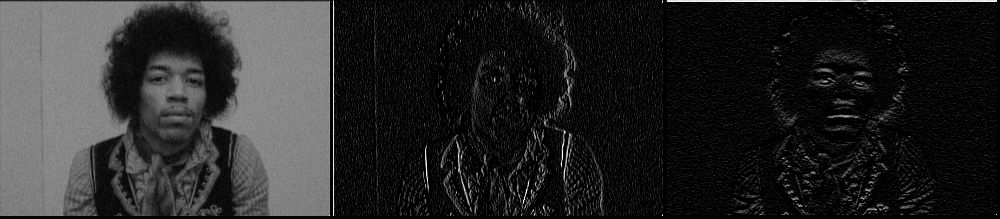

In [ ]:
mask_x_s = np.array([[1,0,-1],  #Sobel Edge Detector
                   [2,0,-2],
                   [1,0,-1]]);
mask_y_s = np.array([[1,2,1],[0,0,0],[-1,-2,-1]]);
sobel_x = convolve2D(sharp_median,mask_x_s, 1 )
sobel_y = convolve2D(sharp_median,mask_y_s, 1)
#sobely = cv.Sobel(sharp_median,cv.CV_64F,0,1,ksize=5)
#sobelx = cv.Sobel(sharp_median,cv.CV_64F,1,0,ksize=5)
#cv2_imshow(sobelx)
#cv2_imshow(sobely)

#cv2_imshow(prewitt_x)
res = np.hstack((sharp_median,sobel_x,sobel_y)) #stacking images side-by-side
cv2_imshow(res)

Let's try to combine the two sobel derivatives by applying squaring and adding both matrices. Essentially getting the magnitude. 

-883.7144565891048
0.0


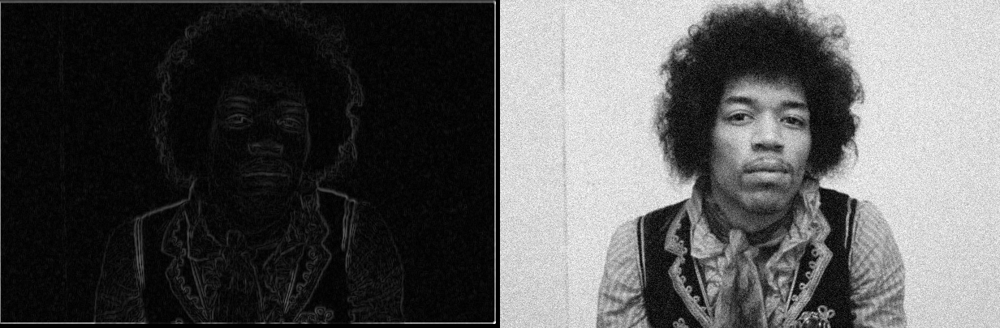

In [ ]:
sobel_gradient = np.sqrt(np.square(sobel_x) + np.square(sobel_y))
sobel_gradient_normalized = np.zeros(sobel_gradient.shape)
print(np.amin(sobel_x))
cv.normalize(sobel_gradient, sobel_gradient_normalized, 0, 255, cv.NORM_MINMAX)
print(np.amin(sobel_gradient_normalized))
res = np.hstack((sobel_gradient_normalized,image_noise)) #stacking images side-by-side
cv2_imshow(res)

So that's how we get edges. Well, that's one way. There are others that are much better like Laplacian edge detector or canny edge detector. A lot of research has taken place and is going on, so things are always improving.

We'll take a look at some other edge detectors. Instead of working through everything like for Sobel, we'll just use the opencv functions, just to get a sense how better it has become

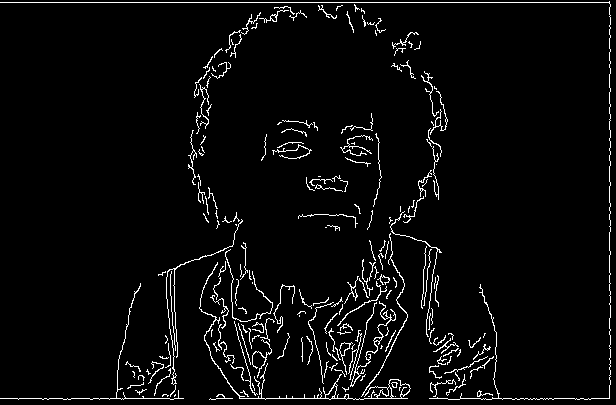

In [ ]:
canny_result = cv.Canny(np.uint8(image_gaussian),100,200)
cv2_imshow(canny_result) # This is canny edge detector, one of the most popular ones. 

# Histogram
Must have read in statistics. Very useful here too. In image processing, it plots the frequency of occurance of a particular pixel values. Lets take a look at what an image histogram looks like. We'll use opencv function - [cv.calcHist()](https://docs.opencv.org/master/d6/dc7/group__imgproc__hist.html#ga4b2b5fd75503ff9e6844cc4dcdaed35d)

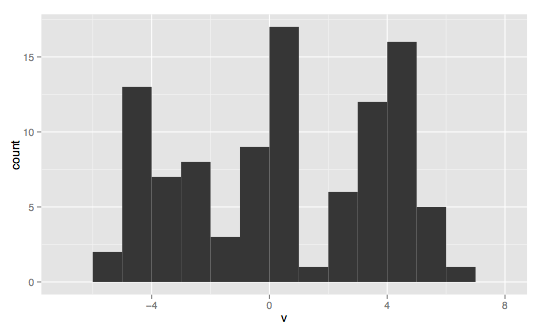



(405, 616)


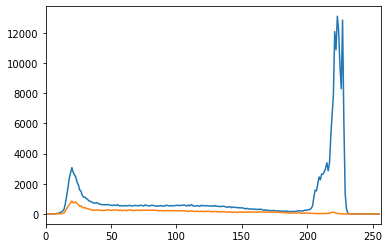

In [ ]:
ex2=1;
ex3=0;

hist = cv.calcHist([image_3],[0],None, [256], [0,256]) #image, channel, Mask, Bin count, range
plt.plot(hist)
plt.xlim([0,256])

#with mask
if ex2:
  print(image_3.shape)
  mask = np.zeros(image_3.shape[:2],np.uint8)
  mask[100:300, 200:400]=255
  hist_mask = cv.calcHist([image_3],[0],mask, [256], [0,256]) #image, channel, Mask, Bin count, range
  plt.plot(hist_mask)
  plt.xlim([0,256])

if ex3:
  mask = np.zeros(image_3.shape[:2],np.uint8)
  mask[100:300, 200:400]=255
  image_mask = cv.bitwise_and(image_3,image_3, mask=mask)
  cv2_imshow(image_mask)

#So what all can we do with it?


### 1. Histogram Sliding

Adding a scalar to each element shifts the histogram and the actual effect on the image might be very familiar to a lot of you

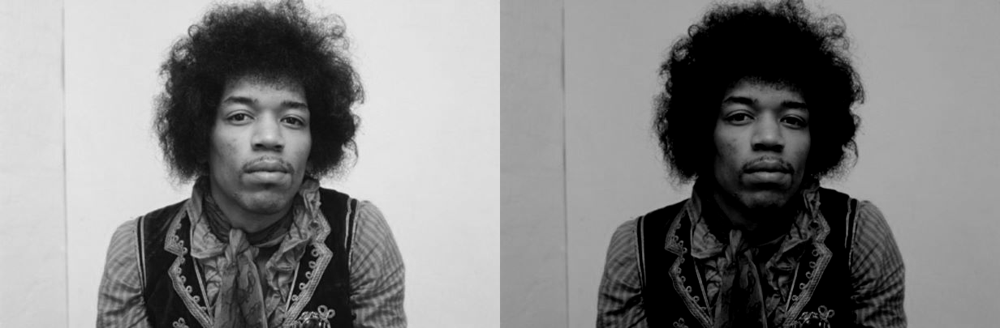

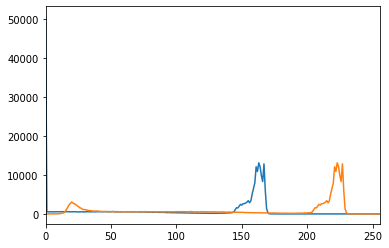

In [ ]:
ex1=1;

image_shifted = cv.add(image_3, -60)
image_shifted = np.clip(image_shifted, 0, 255)

hist_shifted = cv.calcHist([image_shifted],[0],None, [256], [0,256]) #image, channel, Mask, Bin count, range
plt.plot(hist_shifted)
plt.plot(hist)
plt.xlim([0,256])

if ex1:
  res = np.hstack((image_3,image_shifted)) #stacking images side-by-side
  cv2_imshow(res)


So basically, histogram sliding results in adjustment of brightness of image. Useful in underexposed or overexposed images.


Next we'll take a look at the role of histogram in contrast adjustment. There are two ways to do it: Histogram Stretching and Histogram Equalization

### 2. Histogram Stretching

It stretches the pixel values according to the following formula:


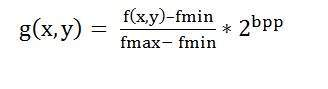




And the histogram changes something like this:

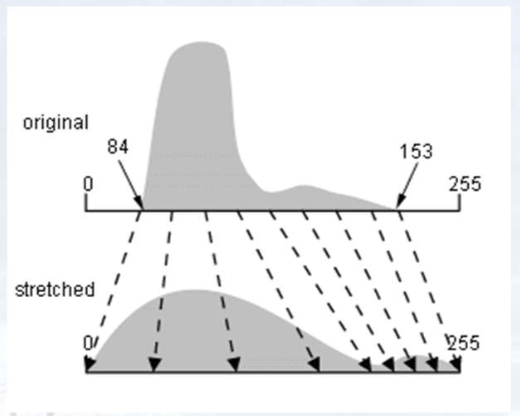

### Contrast
An image with more contrast is considered a 'good' image in some sense. Take a look at the following example 

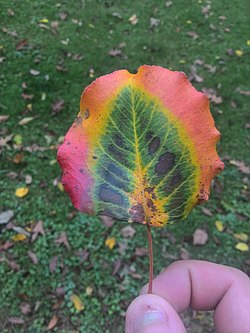     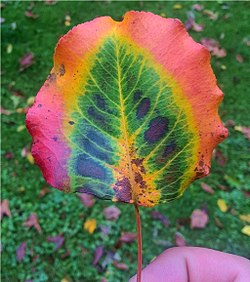

and another:

 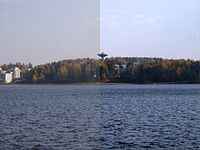

### 3. Histogram Equalization

Another way to do the same but suffers from its own issues. This doesn't always guarantee contrast enhancement but a useful tool nonetheless


### Theory behind histogram equalization

A good contrast image would have pixel values more evenly distributed all over the range. This is what histogram equalization (and stretching) does. 

First, we need to calculate the probability mass function (PMF) of the image. PMF basically is the probability of that pixel value occuring, which is nothing but its frequency divided by the total number of pixels. 

In other words, a PMF graph would look exactly like a histogram divided by total number of pixels.

249480


(0.0, 255.0)

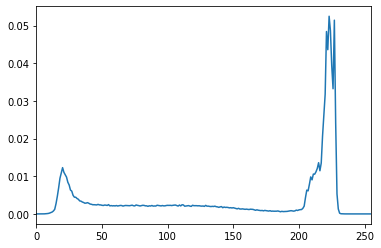

In [ ]:
#Let's take a look at the PMF distribution of our image

pixel_count = image_3.shape[0]*image_3.shape[1]
print(pixel_count)
pmf_dist = hist/pixel_count
plt.plot(pmf_dist)
plt.xlim([0,255])

Now we need to get the cumulative distribution function, which is just a cumulative version of the graph above

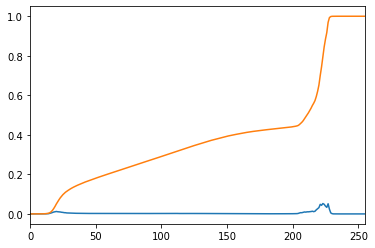

In [ ]:
hist_np,bins = np.histogram(image_3.flatten(),256,[0,256])
pmf_dist_np = hist_np/pixel_count
plt.plot(pmf_dist_np)
plt.xlim([0,255])
cdf = pmf_dist_np.cumsum()
plt.plot(cdf)

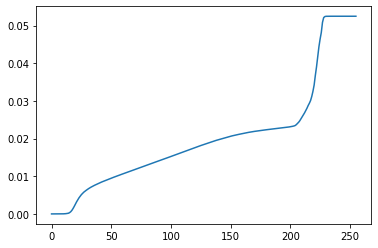

In [ ]:
cdf_normalized = cdf * float(pmf_dist_np.max())
plt.plot(cdf_normalized)

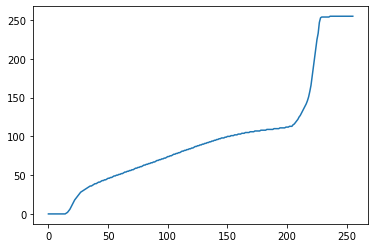

In [ ]:
cdf_m = np.ma.masked_equal(hist_np.cumsum(),0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')

plt.plot(cdf)

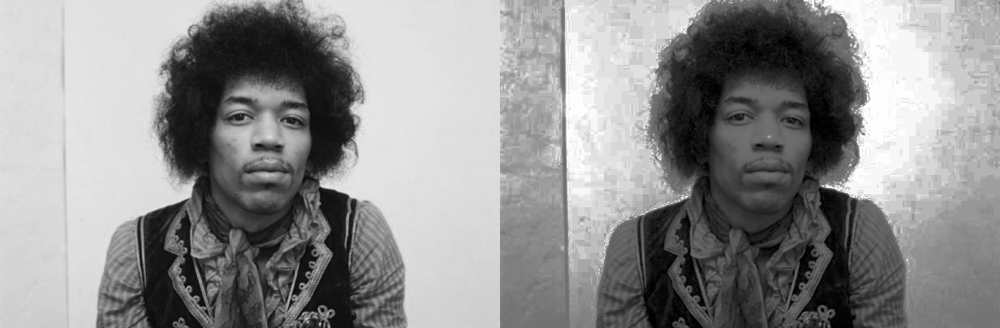

In [ ]:
image_equalized = cdf[image_3]
res = np.hstack((image_3,image_equalized)) #stacking images side-by-side
cv2_imshow(res)

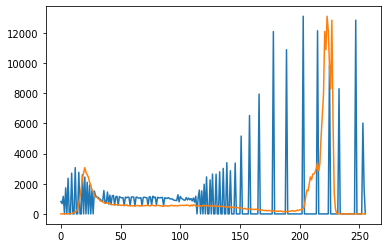

In [ ]:
hist_equalized,bins = np.histogram(image_equalized.flatten(),256,[0,256])
plt.plot(hist_equalized)
plt.plot(hist)

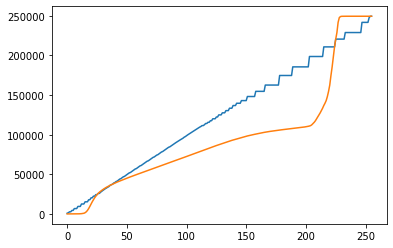

In [ ]:
plt.plot(hist_equalized.cumsum())
plt.plot(hist.cumsum())

Using the opencv function [cv.equalizeHist():](https://docs.opencv.org/master/d6/dc7/group__imgproc__hist.html#ga7e54091f0c937d49bf84152a16f76d6e)

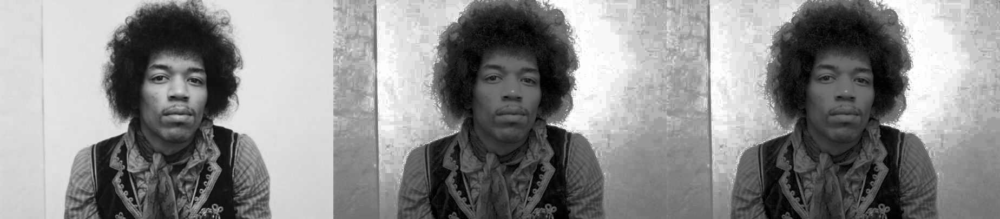

In [ ]:
image_cv_eq = cv.equalizeHist(image_3)
res = np.hstack((image_3,image_equalized,image_cv_eq)) #stacking images side-by-side
cv2_imshow(res)

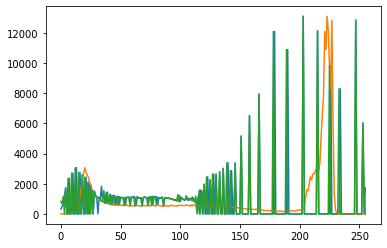

In [ ]:
hist_cv_eq = cv.calcHist([image_cv_eq],[0],None, [256], [0,256])
plt.plot(hist_cv_eq)
plt.plot(hist)
plt.plot(hist_equalized)

### Histogram Backpropagation
This is another application of the histogram. Won't go into detail much. It's primarily used to segment areas similar to the object of interest. In out final result, each pixel will correspond to the probability of the corresponding pixel values in the original image matching that in our target object. 

It's mainly done on basis of color, and therefore we'll do it on colored image of our favourite guitarist, Jimi Hendrix. Now let's just run through one example and get a better sense of what I mean by segmenting image. 



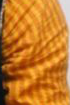

In [ ]:
roi = image_2[300:600, 430:500]
cv2_imshow(roi)

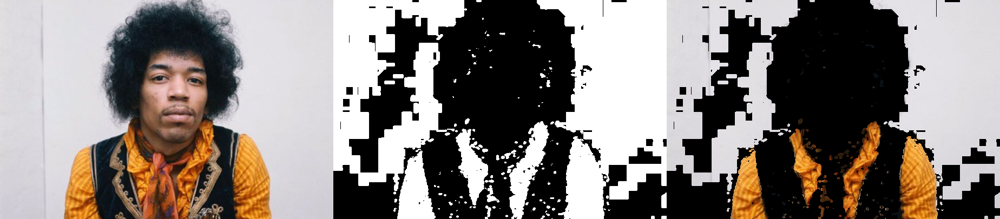

In [ ]:
hsv = cv.cvtColor(roi,cv.COLOR_BGR2HSV)
target = image_2
hsvt = cv.cvtColor(target,cv.COLOR_BGR2HSV)
roihist = cv.calcHist([hsv],[0, 1], None, [180, 256], [0, 180, 0, 256] )

# normalize histogram and apply backprojection
cv.normalize(roihist,roihist,0,255,cv.NORM_MINMAX)
dst = cv.calcBackProject([hsvt],[0,1],roihist,[0,180,0,256],1)

# Now convolute with circular disc
disc = cv.getStructuringElement(cv.MORPH_ELLIPSE,(5,5))
cv.filter2D(dst,-1,disc,dst)

# threshold and binary AND
ret,thresh = cv.threshold(dst,50,255,0)
thresh = cv.merge((thresh,thresh,thresh))
res = cv.bitwise_and(target,thresh)
res = np.hstack((target,thresh,res))
cv2_imshow(res)

# Geometric Transformations

All images captured contain some distortion. It may be due to the lens shape or the perspective angle of the camera. Well, these things can be fixed using image processing. 

We'll also look at some other standard geometric transformations such as from fisheye to equirectangular, from equirectangular to perspective etc. 

## Spherical to Equirectangular

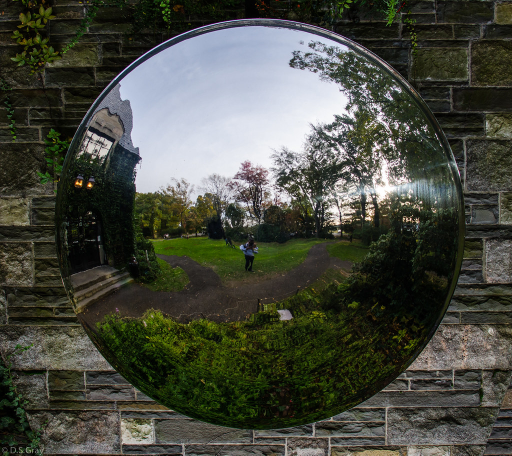

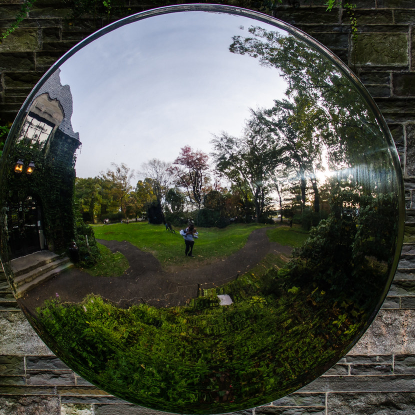

In [ ]:
url_mirror = 'https://i.ibb.co/RzbRLTM/convex.jpg'

image_mirror = io.imread(url_mirror) 
image_mirror = cv.resize(image_mirror, (0,0), fx=0.5, fy=0.5) 
image_mirror = cv.cvtColor(image_mirror, cv.COLOR_BGR2RGB) 
#image_ctrg = cv.cvtColor(image_ctr, cv.COLOR_BGR2GRAY)

cv2_imshow(image_mirror)
image_mirror = image_mirror[15:430,60:475]
shape = image_mirror.shape

cv2_imshow(image_mirror)

In [ ]:
import numpy as np

def lerp(y0, y1, x0, x1, x):
    m = (y1 - y0) / (x1 - x0)
    b = y0
    return m *(x-x0) + b

def mapofx(size, aperture):

    h_src, w_src = size
    w_dst, h_dst = (2880,720)

    dst_imgx = np.zeros((h_dst, w_dst),dtype=np.float32)
    dst_imgy = np.zeros((h_dst, w_dst),dtype=np.float32)

    for y in range(h_dst):
        y_dst_norm = lerp(-1, 1, 0, h_dst, y)        
        
        for x in range(w_dst):
            x_dst_norm = lerp(-1, 1, 0, w_dst, x)

            longitude = x_dst_norm * np.pi
            latitude = y_dst_norm * np.pi / 2
            p_x = np.cos(latitude) * np.cos(longitude)
            p_y = np.cos(latitude) * np.sin(longitude)
            p_z = np.sin(latitude)

            p_xz = np.sqrt(p_x**2 + p_z**2)
            r = 2 * np.arctan2(p_xz, p_y) / aperture
            theta = np.arctan2(p_z, p_x)
            x_src_norm = r * np.cos(theta)
            y_src_norm = r * np.sin(theta)

            x_src = lerp(0, w_src-10, -1, 1, x_src_norm)
            y_src = lerp(0, h_src-10, -1, 1, y_src_norm)

            # supppres out of the bound index error (warning this will overwrite multiply pixels!)
            x_src_ = np.minimum(w_src - 1, np.floor(x_src).astype(np.float32))
            y_src_ = np.minimum(h_src - 1, np.floor(y_src).astype(np.float32))

            dst_imgx[y, x] = (x_src)
            dst_imgy[y, x] = (y_src)
            
       
    #dst_imgx, dst_imgy = cv2.convertMaps(dst_imgx, dst_imgy, cv2.CV_32FC1) 
    pos = [dst_imgx,dst_imgy]
    
    return pos

mapping = mapofx(shape[:2],np.pi)

print("success")
#np.savetxt('mapping.txt',mapping)


success


In [ ]:
print(mapping)

[array([[202.5    , 202.5    , 202.5    , ..., 202.5    , 202.5    ,
        202.5    ],
       [202.27911, 202.27911, 202.27914, ..., 202.27919, 202.27914,
        202.27911],
       [202.05821, 202.05823, 202.05827, ..., 202.05838, 202.05829,
        202.05824],
       ...,
       [201.83733, 201.83734, 201.8374 , ..., 201.83759, 201.83745,
        201.83736],
       [202.05821, 202.05823, 202.05827, ..., 202.05838, 202.05829,
        202.05824],
       [202.27911, 202.27911, 202.27914, ..., 202.27919, 202.27914,
        202.27911]], dtype=float32), array([[ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 1.2047856e-04, -1.1066986e-03, -2.3338008e-03, ...,
         3.8015265e-03,  2.5746846e-03,  1.3476375e-03],
       [ 4.8191409e-04, -1.9724530e-03, -4.4267066e-03, ...,
         7.8438269e-03,  5.3902408e-03,  2.9362077e-03],
       ...,
       [ 4.0499890e+02,  4.0500259e+02,  4.0500629e+02, ...,
         4.0498

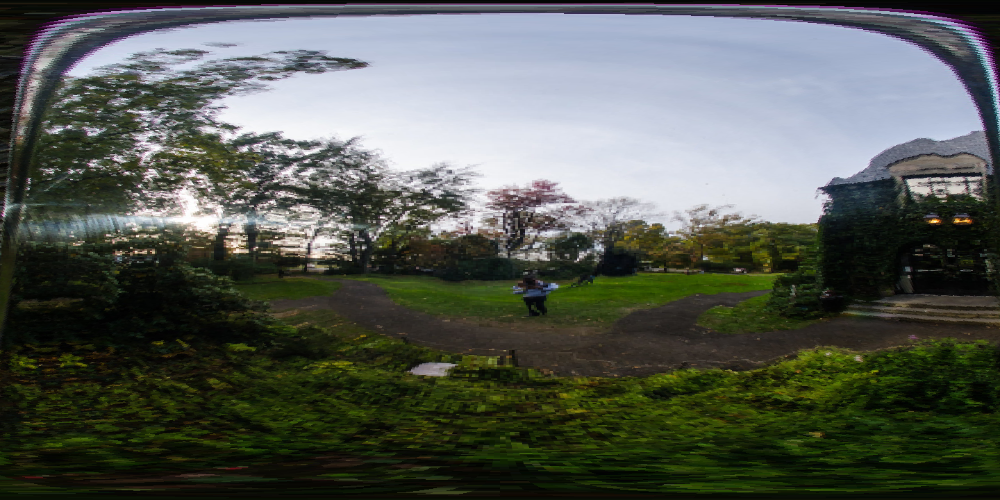

In [ ]:
mapx = mapping[0]
mapy = mapping[1]

dst1 = cv.remap(image_mirror,mapx,mapy,cv.INTER_NEAREST)
dst1 = dst1[0:720,1440:2880]
dst2 = dst1
cv2_imshow(dst1)

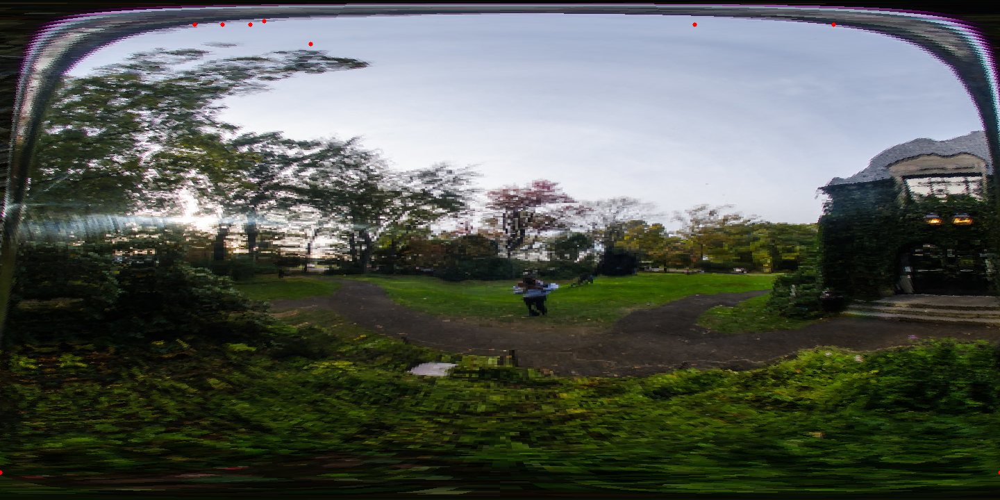

[[ 280.   35.]
 [1000.   35.]
 [1440.  680.]
 [   0.  680.]]


In [ ]:
cv.circle(dst1,(280,35), 3, (0,0,255), -1)
cv.circle(dst1,(1000,35), 3, (0,0,255), -1)
cv.circle(dst1,(0,680), 3, (0,0,255), -1)
cv.circle(dst1,(1440,680), 3, (0,0,255), -1)

cv2_imshow(dst1)

pts = np.array([[280,35],
       [1000,35],
       [1440,680],
       [0,680]],dtype = "float32")

print(pts)

## Equirectangular to Perspective


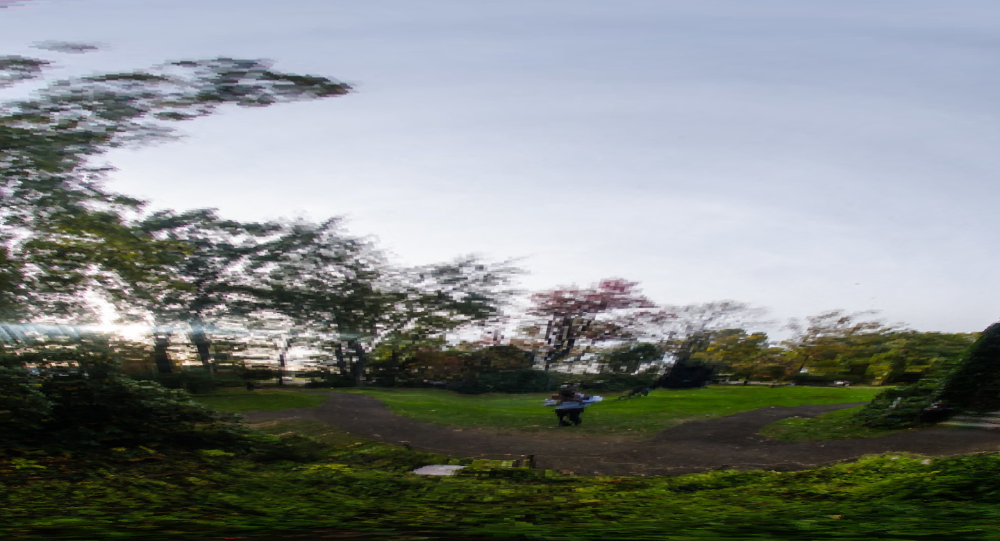

In [ ]:
# now that we have our rectangle of points, let's compute
# the width of our new image
(tl, tr, br, bl) = pts
widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
# ...and now for the height of our new image
heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
# take the maximum of the width and height values to reach
# our final dimensions
maxWidth = max(int(widthA), int(widthB))
maxHeight = max(int(heightA), int(heightB))
# construct our destination points which will be used to
# map the screen to a top-down, "birds eye" view
dst = np.array([
	[0, 0],
	[maxWidth - 1, 0],
	[maxWidth - 1, maxHeight - 1],
	[0, maxHeight - 1]], dtype = "float32")
# calculate the perspective transform matrix and warp
# the perspective to grab the screen
M = cv.getPerspectiveTransform(pts, dst)
warp = cv.warpPerspective(dst2, M, (maxWidth, maxHeight))

cv2_imshow(warp)

## Affine Transformations

In such transformations, straight lines stay straight lines. Basically a bunch of rotations and translation of the original image.

# Contours

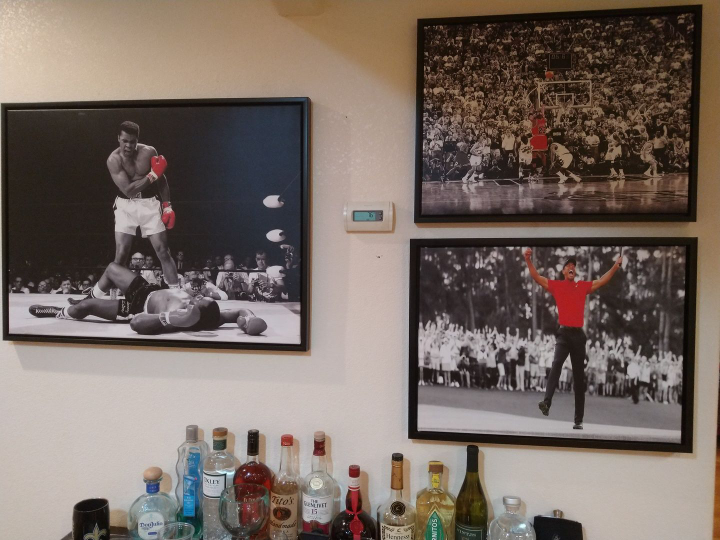

In [ ]:
#Let's take up a new photo
url_davinci =  "https://i.ibb.co/SxbWfhm/DaVinci2.jpg"
url_davinci = "https://i.ibb.co/413Ky62/DaVinci1.jpg"
url_ali = 'https://i.ibb.co/sKyX2y6/4k-MAGMy-Vfq-mid.jpg'
      
image_ctr = io.imread(url_ali) 
image_ctr = cv.resize(image_ctr, (0,0), fx=0.5, fy=0.5) 
image_ctrc = cv.cvtColor(image_ctr, cv.COLOR_BGR2RGB) 
image_ctrg = cv.cvtColor(image_ctr, cv.COLOR_BGR2GRAY)

cv2_imshow(image_ctrc)


In [ ]:

def thresh_callback(image, val):
  threshold = val
  canny_output = cv.Canny(image, threshold, threshold*2)
  contours, hierarchy = cv.findContours(canny_output, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

  drawing = np.zeros((image.shape[0], image.shape[1], 3), dtype = np.uint8)
  for i in range(len(contours)):
    color = (255,255,255)
    cv.drawContours(drawing, contours, i, color, 2, cv.LINE_8, hierarchy, 0)

  cv2_imshow(canny_output)
  cv2_imshow(drawing)

  return contours

src_gray = cv.cvtColor(image_ctr, cv.COLOR_BGR2GRAY)
src_gray = cv.blur(src_gray, (3,3))

contours = thresh_callback(src_gray, 100)
print(contours[8])


[]
[[[310  98]]

 [[  0 103]]

 [[  2 339]]

 [[309 350]]]
STEP 2: Find contours of paper


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  This is separate from the ipykernel package so we can avoid doing imports until


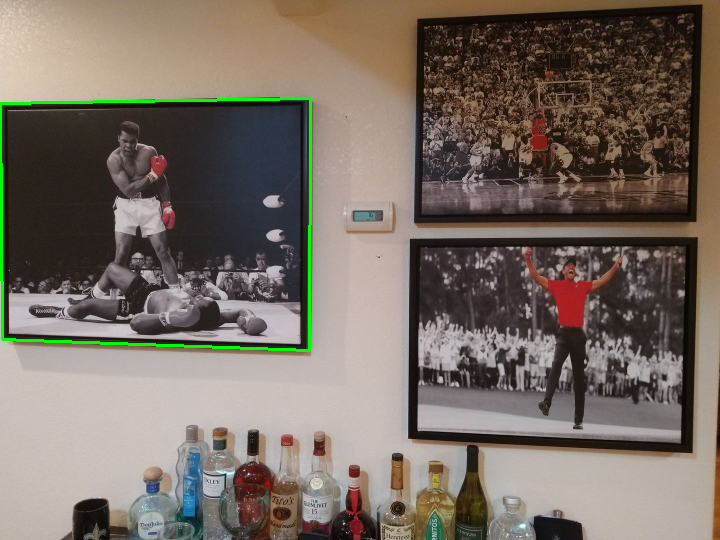

In [ ]:
# find the contours in the edged image, keeping only the
# largest ones, and initialize the screen contour
cntrs = np.array(contours)
contours = sorted(contours, key = cv.contourArea, reverse = True)[:5]
# loop over the contours
for c in contours:
 	# approximate the contour
  peri = cv.arcLength(c, True)
  approx = cv.approxPolyDP(c, 0.02 * peri, True)
  print(approx)
	#
	# if our approximated contour has four points, then we
	# can assume that we have found our screen
  if len(approx)>=4:
    screenCnt = approx
    break
# show the contour (outline) of the piece of paper
print("STEP 2: Find contours of paper")
cv.drawContours(image_ctrc, [screenCnt], -1, (0, 255, 0), 2)
cv2_imshow(image_ctrc)


## Convex Hull

A convex hull basically covers the contours in a polygon. Its often useful to have a defined shape over objects. For example, on a road, it's prudent to cover cars in rectangles to avoid collision. 


In [ ]:
hull_list = []

for i in range(len(contours)):
    hull = cv.convexHull(contours[i])
    hull_list.append(hull)

In [ ]:
cv.drawContours(image_ctrc, hull_list, -1, (0, 255, 0), 2)
cv2_imshow(image_ctrc)

Let's do it on a picture where its more apparent

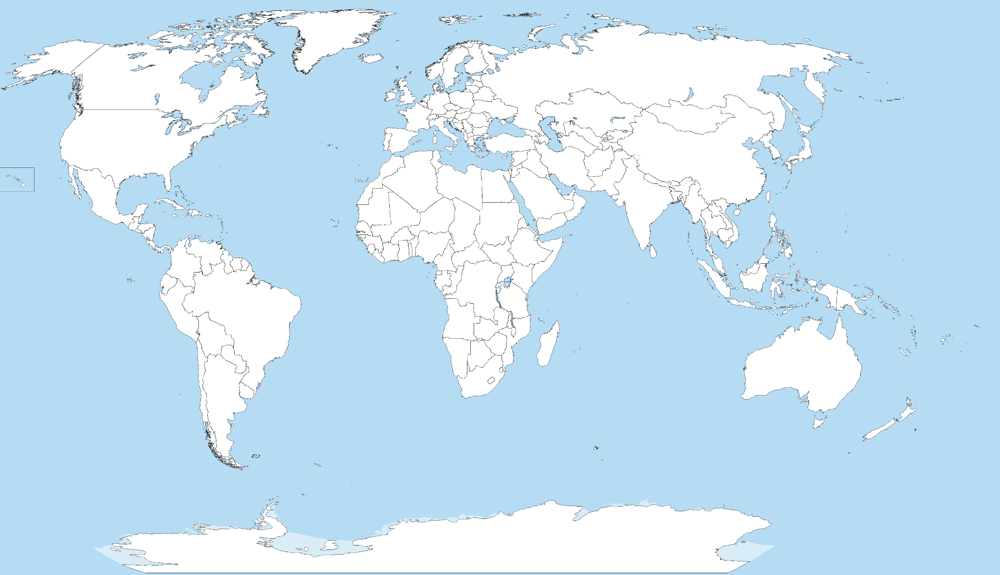

In [ ]:
url_map = 'https://i.ibb.co/fGQwwC0/A-large-blank-world-map-with-oceans-marked-in-blue.png'

image_map = io.imread(url_map) 
image_map = cv.resize(image_map, (0,0), fx=0.6, fy=0.6) 
image_mapc = cv.cvtColor(image_map, cv.COLOR_BGR2RGB)
image_mapg = cv.cvtColor(image_map, cv.COLOR_BGR2GRAY) 


cv2_imshow(image_mapc)

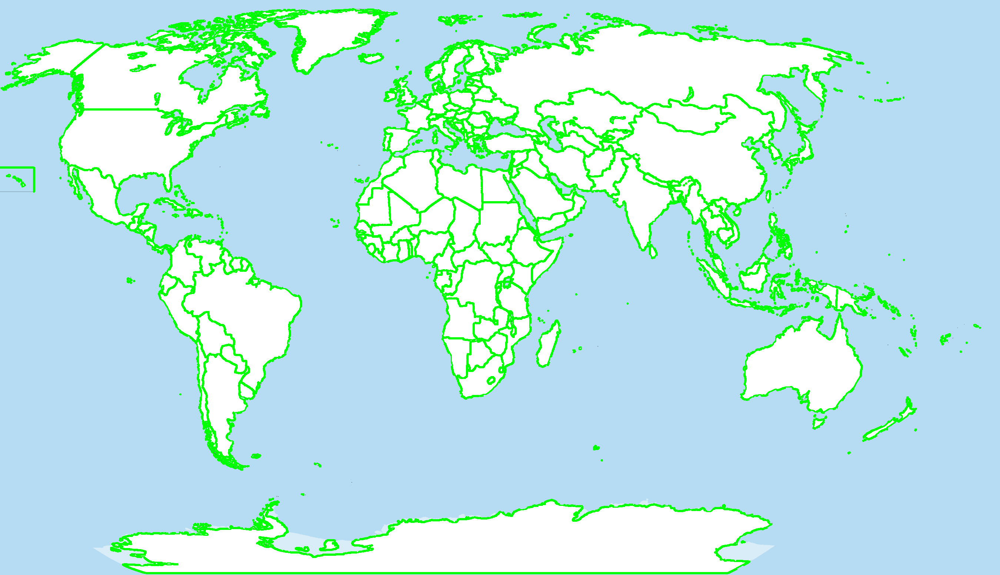

In [ ]:
def thresh_callback(image, val):
  threshold = val
  canny_output = cv.Canny(image, threshold, threshold*2)
  contours, hierarchy = cv.findContours(canny_output, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

  drawing = np.zeros((image.shape[0], image.shape[1], 3), dtype = np.uint8)
  for i in range(len(contours)):
    color = (255,255,255)
    cv.drawContours(drawing, contours, i, color, 2, cv.LINE_8, hierarchy, 0)

  return contours

src_gray = cv.cvtColor(image_mapc, cv.COLOR_BGR2GRAY)
src_gray = cv.blur(src_gray, (3,3))

contours_map = thresh_callback(src_gray, 100)

image_map_copied = image_mapc

cv.drawContours(image_mapc, contours_map, -1, (0, 255, 0), 2)
cv2_imshow(image_mapc)

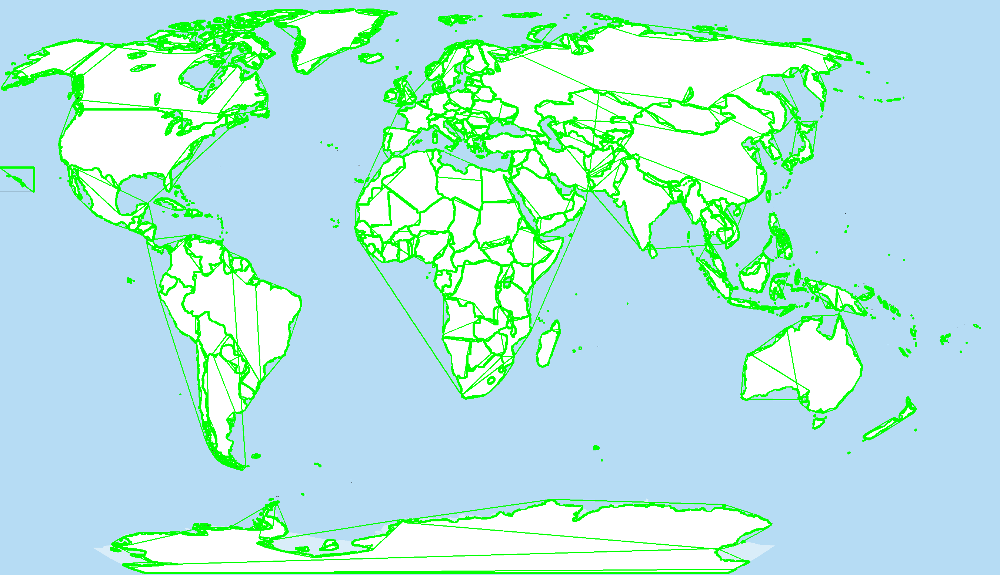

In [ ]:
hull_list_map = []

for i in range(len(contours_map)):
    hull = cv.convexHull(contours_map[i])
    hull_list_map.append(hull)

cv.drawContours(image_map_copied, hull_list_map, -1, (0, 255, 0), 2)
cv2_imshow(image_map_copied)


Now, build me a document scanner!